## Import Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sklearn as sk
import os
current_path = os.getcwd()
print('Current directory: ',current_path)

import warnings
warnings.filterwarnings('ignore')

Current directory:  C:\Users\saipo\DAI Assignment\Dai_1


## Import and read Data

In [2]:
%%time

df = pd.read_csv("data.csv")
df.drop(['id'],axis=1,inplace=True)
df.drop(['Unnamed: 32'],axis=1,inplace=True)
df.diagnosis = [1 if each == "M" else 0 for each in df.diagnosis]

Wall time: 1.43 s


In [3]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
df.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [6]:
%%time

import sweetviz as sv
feature_config = sv.FeatureConfig()
my_report = sv.analyze(source=(df,'Disease Dataset'),pairwise_analysis='on',feat_cfg=feature_config)
my_report.show_html('data_REPORT.html') ## you can also open this html file manually - it is generated in the current notebook folder

                                             |                                             | [  0%]   00:00 ->…

Report data_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
Wall time: 50.2 s


## Correlation of attributes

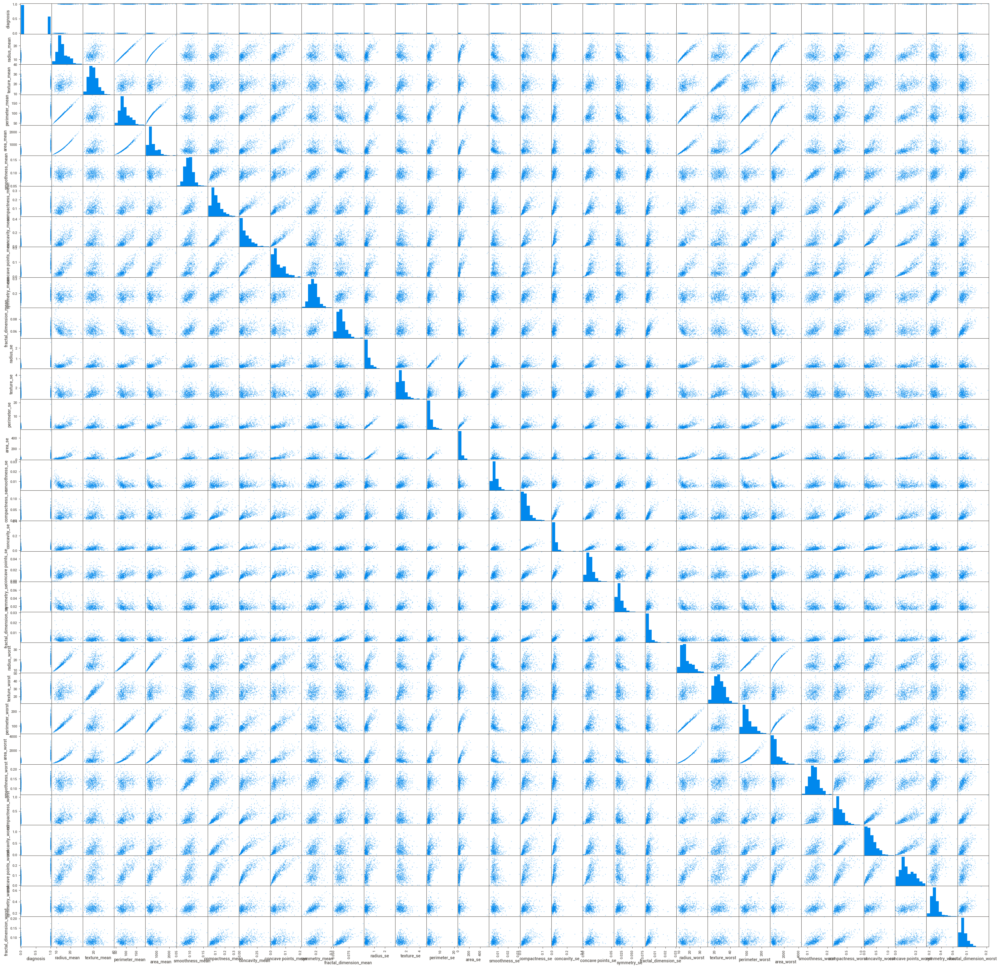

In [7]:
from pandas.plotting import scatter_matrix
scatter_matrix(df,figsize=(40,40));

<AxesSubplot:>

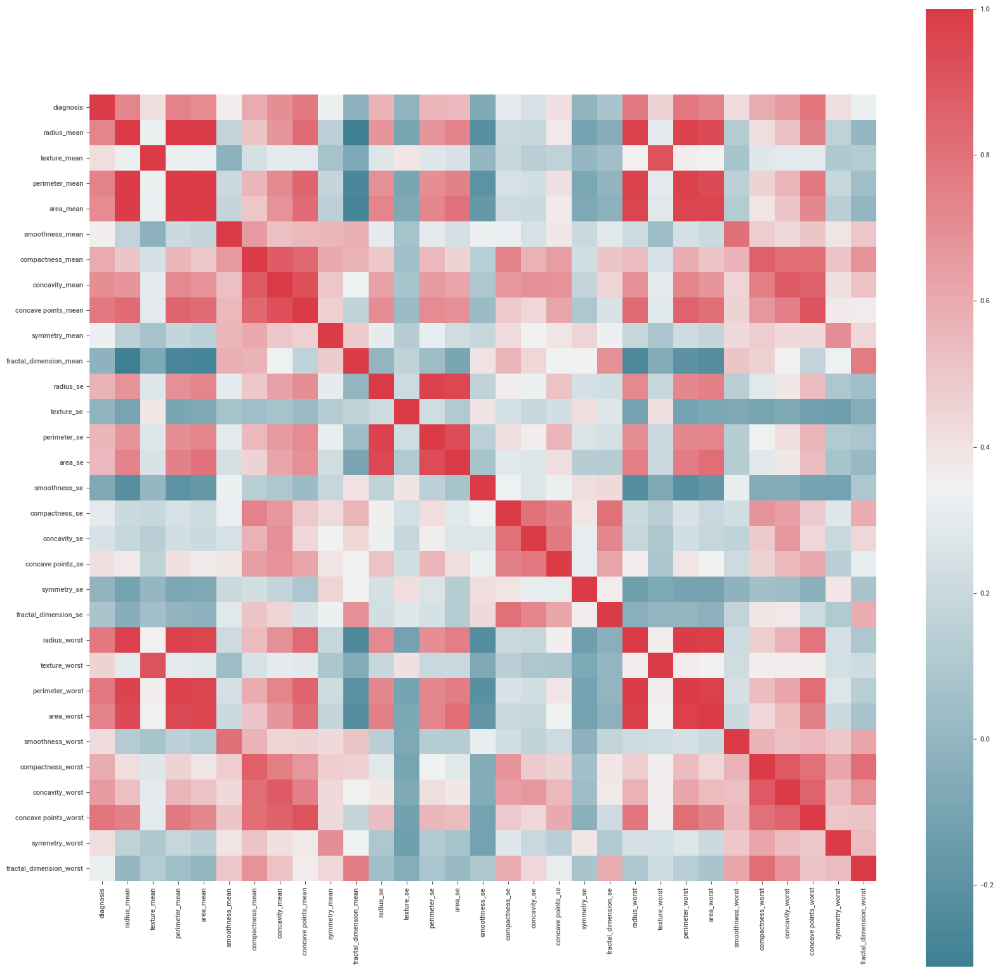

In [8]:
corr = df.corr()
import seaborn as sns
f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),square=True, ax=ax)

In [9]:
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

## Data Normalization

In [10]:
features = ['radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']
predict = 'diagnosis'

In [11]:
# Most of tha attibute have different scales - Use normalization
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(df[features])
scaled = scaler.transform(df[features])
scaled_df = pd.DataFrame(scaled, columns=df[features].columns)


scaled_df[predict] = df[predict]

## Train and Test Split

In [12]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(scaled_df, test_size=0.3, shuffle=True, random_state=1)

X_train = df_train[features]
X_test = df_test[features]
y_train = df_train[predict]
y_test = df_test[predict]

## KNN, Naive Bayes, Logistic Regression,Support Vector Machines and Decision Tree.

In [13]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from sklearn import tree

### Logistic Regression

In [14]:
model = Pipeline([
    ("model",LogisticRegression())
])
model.fit(X_train,y_train)
pred_train = model.predict(X_train)
pred_LRtest = model.predict(X_test)
model.score(X_test,y_test)

0.9649122807017544

### Naive Bayes

In [15]:
model = Pipeline([
    ("model",GaussianNB())
])
model.fit(X_train,y_train)
pred_train = model.predict(X_train)
pred_test = model.predict(X_test)
model.score(X_test,y_test)

0.935672514619883

### Support Vector Machines

In [16]:
clf = svm.SVC()
clf.fit(X_train,y_train)
clf.predict(X_test)
clf.score(X_test,y_test)


0.9649122807017544

### Decision Tree Classification

[Text(193.75, 276.8333333333333, 'X[22] <= 0.272\ngini = 0.468\nsamples = 398\nvalue = [249, 149]'),
 Text(88.57142857142857, 226.5, 'X[27] <= 0.464\ngini = 0.049\nsamples = 237\nvalue = [231, 6]'),
 Text(44.285714285714285, 176.16666666666666, 'X[10] <= 0.193\ngini = 0.009\nsamples = 225\nvalue = [224, 1]'),
 Text(22.142857142857142, 125.83333333333331, 'gini = 0.0\nsamples = 222\nvalue = [222, 0]'),
 Text(66.42857142857143, 125.83333333333331, 'X[17] <= 0.302\ngini = 0.444\nsamples = 3\nvalue = [2, 1]'),
 Text(44.285714285714285, 75.5, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(88.57142857142857, 75.5, 'gini = 0.0\nsamples = 2\nvalue = [2, 0]'),
 Text(132.85714285714286, 176.16666666666666, 'X[21] <= 0.397\ngini = 0.486\nsamples = 12\nvalue = [7, 5]'),
 Text(110.71428571428571, 125.83333333333331, 'gini = 0.0\nsamples = 6\nvalue = [6, 0]'),
 Text(155.0, 125.83333333333331, 'X[14] <= 0.136\ngini = 0.278\nsamples = 6\nvalue = [1, 5]'),
 Text(132.85714285714286, 75.5, 'gini = 0.0

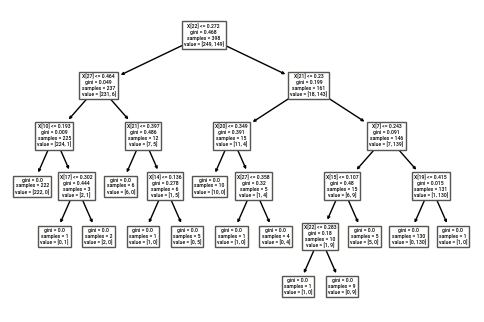

In [17]:
clf = tree.DecisionTreeClassifier()
clf.fit(X_train, y_train)
clf.predict(X_test)
clf.score(X_test,y_test)
tree.plot_tree(clf)

### KNN

In [18]:
from sklearn import neighbors

n_neighbors = 15

clf = neighbors.KNeighborsClassifier(n_neighbors)
clf.fit(X_train, y_train)
clf.predict(X_test)
clf.score(X_test,y_test)

0.9532163742690059

## Visualization of predicted and Actual test data

In [19]:
import plotly.express as px

a= X_train
a[predict] = y_train

b = X_test
b[predict] = y_test

c = X_test
c[predict] = pred_LRtest

In [22]:
import plotly.express as px

In [23]:
px.scatter_3d(b, x='radius_mean', y='texture_mean',z= 'perimeter_mean', color='diagnosis')

In [24]:
px.scatter_3d(c, x='radius_mean', y='texture_mean',z='perimeter_mean', color='diagnosis')